<a href="https://colab.research.google.com/github/NishaMDev/DeepLearning/blob/main/Assignment%233/DL_Assignment_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **MLP non linear regression 3 dimensions.** 

## **Use 3 variables based non linear equation. Generate synthetic data using the equation you used and plot using 4d plot.**

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

Function to plot 4D graph to represent the 3 Dimensional Multi Layer Perceptron Non - Linear Regression Equation.

In [2]:
def plot_4d(x, y, y_pred=None):
  plt.style.use("fivethirtyeight")
  fig = plt.figure(figsize=(12,12))
  ax = fig.add_subplot(projection='3d')
  ax.scatter(x[:, 0], x[:, 1], x[:, 2],s=(y*50),c='hotpink',label='underlying function',alpha=0.6)
  if y_pred is not None:
    ax.scatter(x[:, 0], x[:, 1], x[:, 2],s=(y_pred * 50),c='cornflowerblue', label='our function',alpha=0.6)
  plt.legend()
  plt.xlabel('Dimension 1', fontsize=12)
  plt.ylabel('Dimension 2', fontsize=12)
  plt.ylabel('Dimension 3', fontsize=12)

  plt.show()

## Generate synthetic data based on the equation: $\ 5x_1^2 + 2x_2^2 + x_3^2 + 5x_1 + 2x_2 + x_3 + 1  $

x: (1000, 3), weights: (3, 1), bias: (1,), y: (1000, 1)


/usr/local/lib/python3.7/dist-packages/matplotlib/collections.py:885: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


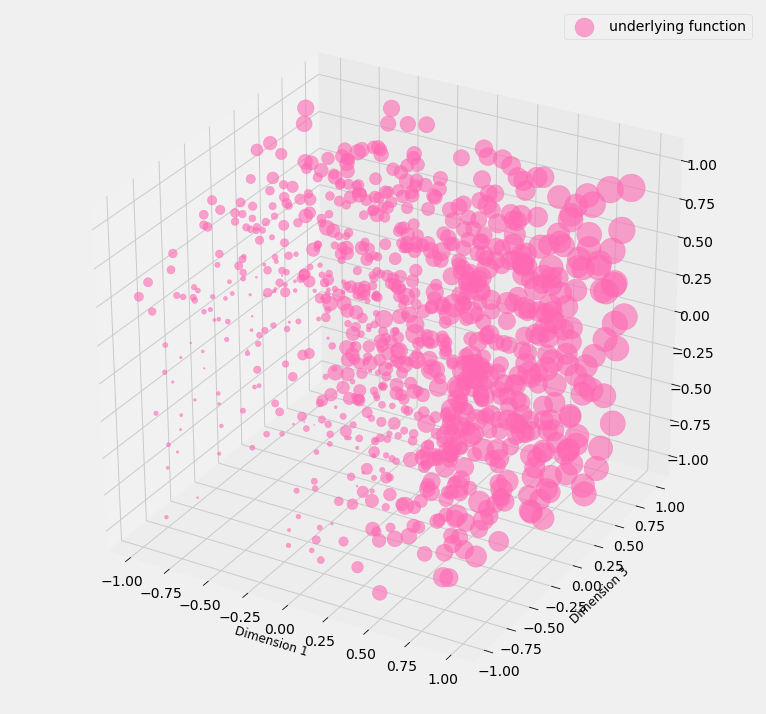

In [3]:
n = 1000
d = 3
x = np.random.uniform(-1, 1, (n, d))

weights_true = np.array([[5, 2, 1],]).T
bias_true = np.array([1])

y_true = (x ** 2) @ weights_true + x @ weights_true + bias_true
print(f'x: {x.shape}, weights: {weights_true.shape}, bias: {bias_true.shape}, y: {y_true.shape}')

plot_4d(x, y_true)

# **Develop 3 Layer deep neural network for non linear regression using *numpy only from scratch*.**  

Use Proper non linear activation functions and proper number of hidden layer neurons to show the results / loss and epochs training and final output. And also perform manual backprop and chain rule based gradient propagation. 

**APPROVED**

In [4]:
# Let's use gradient descent to learn the weights and bias that minimizes the loss function.
# For this, we need the gradient of the loss function and the gradients of the linear function.

class MSE:
  def __call__(self, y_pred, y_true):
    self.y_pred = y_pred
    self.y_true = y_true
    return ((y_pred - y_true) ** 2).mean()

  def backward(self):
    n = self.y_true.shape[0]
    self.gradient = 2. * (self.y_pred - self.y_true) / n
    print('MSE backward', self.y_pred.shape, self.y_true.shape, self.gradient.shape)
    return self.gradient


class Linear:
  def __init__(self, input_dim: int, num_hidden: int = 1):
    self.weights = np.random.randn(input_dim, num_hidden) * np.sqrt(2. / input_dim)
    self.bias = np.zeros(num_hidden)
  
  def __call__(self, x):
    self.x = x
    output = x @ self.weights + self.bias
    return output

  def backward(self, gradient):
    self.weights_gradient = ((2 * self.x.T) + 1)  @ gradient   ## check this
    self.bias_gradient = gradient.sum(axis=0)
    self.x_gradient = gradient @ self.weights.T
    return self.x_gradient

  def update(self, lr):
    self.weights = self.weights - lr * self.weights_gradient
    self.bias = self.bias - lr * self.bias_gradient

In [5]:
# In order to learn non-linear functions, we need non-linearities in our model.
class Relu:
    def __call__(self, input_):
        self.input_ = input_
        self.output = np.clip(self.input_, 0, None)
        return self.output
    
    def backward(self, output_gradient):
      # import pdb; pdb.set_trace()  # By the way, this is how you can debug
      self.input_gradient = (self.input_ > 0) * output_gradient
      return self.input_gradient


In [6]:
class Model:
  def __init__(self, input_dim, num_hidden):
    self.linear1 = Linear(input_dim, num_hidden)
    self.relu = Relu()
    self.linear2 = Linear(num_hidden, 1)
  
  def __call__(self, x):
    l1 = self.linear1(x)
    r = self.relu(l1)
    l2 = self.linear2(r)
    return l2
  
  def backward(self, output_gradient):
    linear2_gradient = self.linear2.backward(output_gradient)
    relu_gradient = self.relu.backward(linear2_gradient)
    linear1_gradient = self.linear1.backward(relu_gradient)
    # print('Model backward', linear2_gradient.shape, relu_gradient.shape, linear1_gradient.shape)
    # import pdb; pdb.set_trace()
    return linear1_gradient

  def update(self, lr):
    self.linear2.update(lr)
    self.linear1.update(lr)

In [7]:
from typing import Callable

def fit(x: np.ndarray, y: np.ndarray, model: Callable, loss: Callable, lr: float, num_epochs: int):
  for epoch in range(num_epochs):
    y_pred = model(x)
    loss_value = loss(y_pred, y)
    print(f'Epoch {epoch}, loss {loss_value}')
    gradient_from_loss = loss.backward()
    model.backward(gradient_from_loss)
    model.update(lr)

MSE backward (1000, 1) (1000, 1) (1000, 1)
28.050162901032778


/usr/local/lib/python3.7/dist-packages/matplotlib/collections.py:885: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


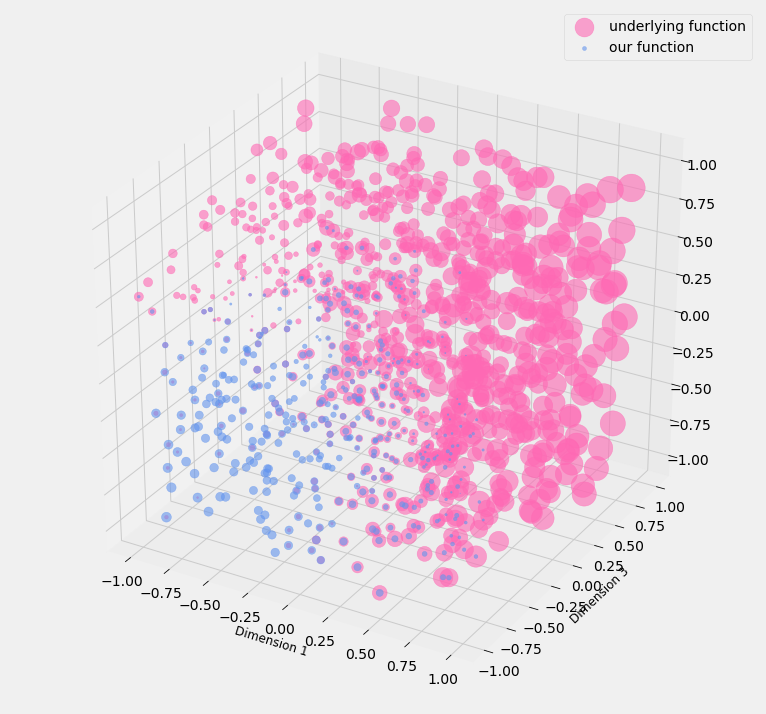

In [8]:
loss = MSE()
model = Model(d, 10)
y_pred = model(x)
loss_value = loss(y_pred, y_true)
loss_gradient = loss.backward()
print(loss_value)
model.backward(loss_gradient)
plot_4d(x, y_true, y_pred)

In [9]:
# Test just one forward and backward step
loss = MSE()
model = Model(d, 10)
y_pred = model(x)
loss_value = loss(y_pred, y_true)
print(loss_value)

loss_gradient = loss.backward()
model.backward(loss_gradient)
model.update(0.1)

y_pred = model(x)
loss_value = loss(y_pred, y_true)
print(loss_value)

27.536178737748372
MSE backward (1000, 1) (1000, 1) (1000, 1)
6.958758409685519


Epoch 0, loss 6.958758409685519
MSE backward (1000, 1) (1000, 1) (1000, 1)
Epoch 1, loss 3.3142247686316972
MSE backward (1000, 1) (1000, 1) (1000, 1)
Epoch 2, loss 6.757868843740377
MSE backward (1000, 1) (1000, 1) (1000, 1)
Epoch 3, loss 19.491195290024752
MSE backward (1000, 1) (1000, 1) (1000, 1)
Epoch 4, loss 6.804253492535497
MSE backward (1000, 1) (1000, 1) (1000, 1)
Epoch 5, loss 3.6093177295621315
MSE backward (1000, 1) (1000, 1) (1000, 1)
Epoch 6, loss 10.669850658832797
MSE backward (1000, 1) (1000, 1) (1000, 1)
Epoch 7, loss 3.5574291229308628
MSE backward (1000, 1) (1000, 1) (1000, 1)
Epoch 8, loss 10.707842631354302
MSE backward (1000, 1) (1000, 1) (1000, 1)
Epoch 9, loss 2.4234188321301895
MSE backward (1000, 1) (1000, 1) (1000, 1)
Epoch 10, loss 6.551576797322843
MSE backward (1000, 1) (1000, 1) (1000, 1)
Epoch 11, loss 4.626225594206997
MSE backward (1000, 1) (1000, 1) (1000, 1)
Epoch 12, loss 13.155494109230924
MSE backward (1000, 1) (1000, 1) (1000, 1)
Epoch 13, loss

/usr/local/lib/python3.7/dist-packages/matplotlib/collections.py:885: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


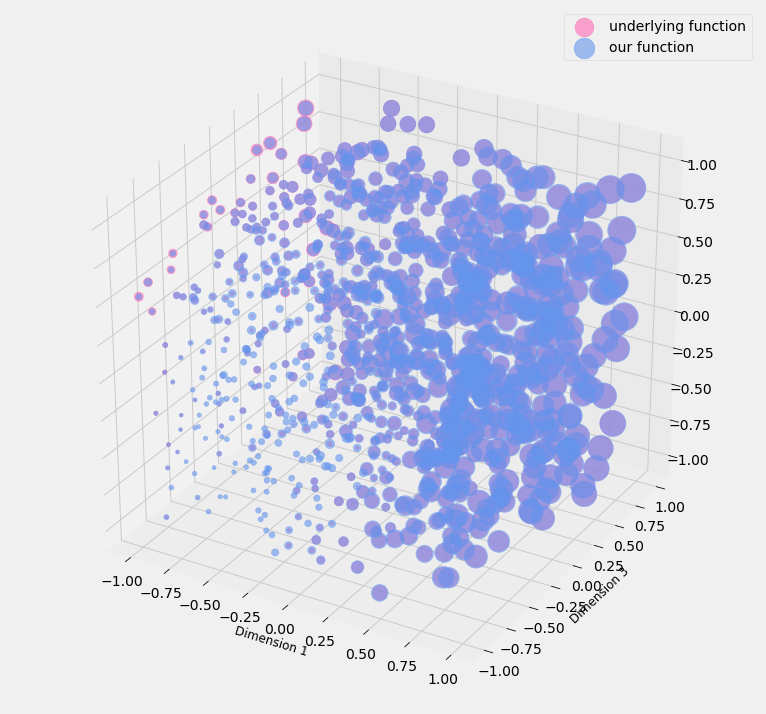

In [10]:
fit(x, y_true, model=model, loss=loss, lr=0.1, num_epochs=40)
plot_4d(x, y_true, model(x))

# **Develop 3 layer deep neural network for non linear regression without using pytorch builtin layer functionality but using pytorch from scratch.**

**APPROVED**

In [11]:
import torch
import torch.nn as nn


class TorchModel(nn.Module):
  def __init__(self, input_dim, num_hidden):
    super().__init__()
    self.linear1 = nn.Linear(input_dim, num_hidden)
    self.relu = nn.ReLU()
    self.linear2 = nn.Linear(num_hidden, 1)
  
  def forward(self, x):
    l1 = self.linear1(x)
    r = self.relu(l1)
    l2 = self.linear2(r)
    return l2


loss = nn.MSELoss()
model = TorchModel(d, 10)
x_tensor = torch.tensor(x).float()
y_true_tensor = torch.tensor(y_true).float()
y_pred_tensor = model(x_tensor)
loss_value = loss(y_pred_tensor, y_true_tensor)
print(loss_value)

tensor(23.3846, grad_fn=<MseLossBackward0>)


In [12]:
# Test just one forward and backward step
optimizer = torch.optim.SGD(model.parameters(), lr=0.1)

optimizer.zero_grad()
y_pred_tensor = model(x_tensor)
loss_value = loss(y_pred_tensor, y_true_tensor)
print(loss_value)
loss_gradient = loss_value.backward()
optimizer.step()

y_pred_tensor = model(x_tensor)
loss_value = loss(y_pred_tensor, y_true_tensor)
print(loss_value)

tensor(23.3846, grad_fn=<MseLossBackward0>)
tensor(17.4219, grad_fn=<MseLossBackward0>)


In [13]:
# Now we run the training loop

def torch_fit(x: np.ndarray, y: np.ndarray, model: Callable, loss: Callable, lr: float, num_epochs: int):
  optimizer = torch.optim.SGD(model.parameters(), lr=lr)
  for epoch in range(num_epochs):
    optimizer.zero_grad()
    y_pred_tensor = model(x_tensor)
    loss_value = loss(y_pred_tensor, y_true_tensor)
    print(loss_value)
    loss_value.backward()
    optimizer.step()

torch_fit(x_tensor, y_true_tensor, model=model, loss=loss, lr=0.1, num_epochs=40)


tensor(17.4219, grad_fn=<MseLossBackward0>)
tensor(13.6202, grad_fn=<MseLossBackward0>)
tensor(10.6536, grad_fn=<MseLossBackward0>)
tensor(8.3645, grad_fn=<MseLossBackward0>)
tensor(6.5601, grad_fn=<MseLossBackward0>)
tensor(5.1121, grad_fn=<MseLossBackward0>)
tensor(4.0168, grad_fn=<MseLossBackward0>)
tensor(3.2218, grad_fn=<MseLossBackward0>)
tensor(2.6699, grad_fn=<MseLossBackward0>)
tensor(2.2789, grad_fn=<MseLossBackward0>)
tensor(1.9943, grad_fn=<MseLossBackward0>)
tensor(1.7766, grad_fn=<MseLossBackward0>)
tensor(1.6125, grad_fn=<MseLossBackward0>)
tensor(1.4892, grad_fn=<MseLossBackward0>)
tensor(1.3950, grad_fn=<MseLossBackward0>)
tensor(1.3187, grad_fn=<MseLossBackward0>)
tensor(1.2551, grad_fn=<MseLossBackward0>)
tensor(1.2010, grad_fn=<MseLossBackward0>)
tensor(1.1529, grad_fn=<MseLossBackward0>)
tensor(1.1105, grad_fn=<MseLossBackward0>)
tensor(1.0718, grad_fn=<MseLossBackward0>)
tensor(1.0359, grad_fn=<MseLossBackward0>)
tensor(1.0019, grad_fn=<MseLossBackward0>)
tensor(0

/usr/local/lib/python3.7/dist-packages/matplotlib/collections.py:885: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


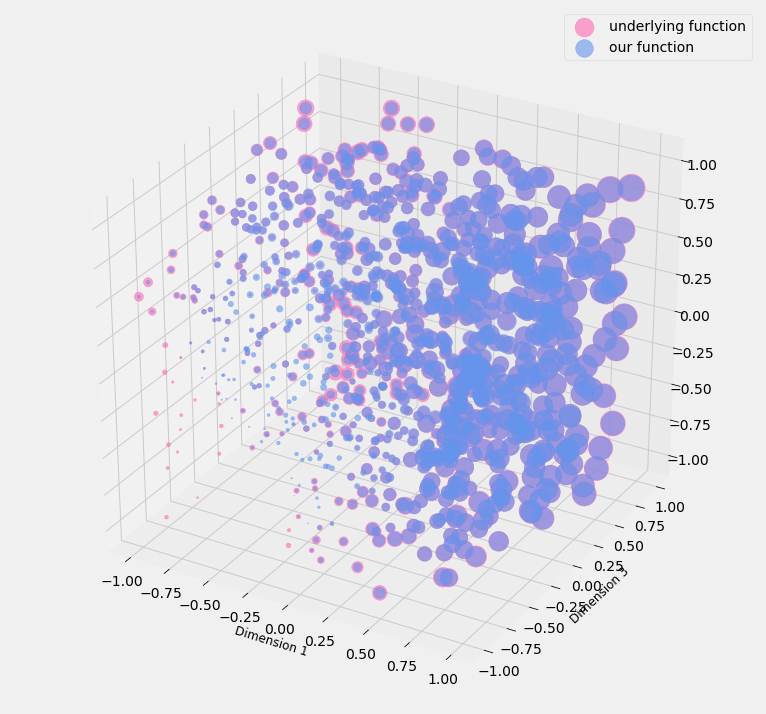

In [14]:
plot_4d(x, y_true, model(x_tensor).detach())

# **Develop 3 layer deep neural network for non linear regression using pytorch builtin layer functionality.**

# **Develop 3 layer deep neural network for non linear regression using pytorch lightening.**

**APPROVED**

In [15]:
#!pip install pytorch_lightning

Install PyTorch Lightning

In [16]:
#%%capture
#! pip install git+https://github.com/PytorchLightning/pytorch-lightning.git@master --upgrade

In [17]:
from argparse import ArgumentParser
from typing import Any, Dict, List, Tuple, Type

import torch
from pytorch_lightning import LightningModule, Trainer, seed_everything
from torch import Tensor, nn
from torch.nn import functional as F
from torch.optim import Adam
from torch.optim.optimizer import Optimizer
from torch.utils.data import Dataset, TensorDataset


class LinearRegression(LightningModule):
    """
    Linear regression model implementing - with optional L1/L2 regularization
    $$min_{W} ||(Wx + b) - y ||_2^2 $$
    """

    def __init__(
        self,
        input_dim: int,
        output_dim: int = 1,
        bias: bool = True,
        learning_rate: float = 1e-4,
        optimizer: Type[Optimizer] = Adam,
        l1_strength: float = 0.0,
        l2_strength: float = 0.0,
        **kwargs: Any,
    ) -> None:
        """
        Args:
            input_dim: number of dimensions of the input (1+)
            output_dim: number of dimensions of the output (default: ``1``)
            bias: If false, will not use $+b$
            learning_rate: learning_rate for the optimizer
            optimizer: the optimizer to use (default: ``Adam``)
            l1_strength: L1 regularization strength (default: ``0.0``)
            l2_strength: L2 regularization strength (default: ``0.0``)
        """
        super().__init__()
        self.save_hyperparameters()
        self.optimizer = optimizer

        self.linear1= nn.Linear(3, 10)
        self.act1 = nn.ReLU()
        self.linear2= nn.Linear(10, 1)

    def forward(self, x: Tensor) -> Tensor:
        
        x = self.linear1(x)
        x  = self.act1(x)
        y_hat = self.linear2(x)
       # print(y_hat.shape)
        return y_hat

    def training_step(self, batch: Tuple[Tensor, Tensor], batch_idx: int) -> Dict[str, Tensor]:
        x, y = batch

        # flatten any input
        x = x.view(x.size(0), -1)
        y_hat = self(x)
        y_hat = y_hat.unsqueeze(1)
        loss = F.mse_loss(y_hat, y, reduction="sum")

        # L1 regularizer
        if self.hparams.l1_strength > 0:
            l1_reg = self.linear2.weight.abs().sum()
            loss += self.hparams.l1_strength * l1_reg

        # L2 regularizer
        if self.hparams.l2_strength > 0:
            l2_reg = self.linear2.weight.pow(2).sum()
            loss += self.hparams.l2_strength * l2_reg

        loss /= x.size(0)
        tensorboard_logs = {'train_loss': loss}
        return {'loss': loss, 'log': tensorboard_logs}

    def validation_step(self, batch: Tuple[Tensor, Tensor], batch_idx: int) -> Dict[str, Tensor]:
        x, y = batch
        x = x.view(x.size(0), -1)
        y_hat = self(x)
        y_hat = y_hat.unsqueeze(1)
        #print("y",y.shape)
        #print("y_hat",y_hat.shape)
        loss = F.mse_loss(y_hat, y, reduction="sum")
        return {'val_loss': loss}

    def validation_epoch_end(self, outputs: List[Dict[str, Tensor]]) -> Dict[str, Tensor]:
        avg_loss = torch.stack([x['val_loss'] for x in outputs]).mean()
        return {'val_loss': avg_loss}

    def test_step(self, batch: Tuple[Tensor, Tensor], batch_idx: int) -> Dict[str, Tensor]:
        x, y = batch
        y_hat = self(x)
        y_hat = y_hat.unsqueeze(1)
        return {'test_loss': F.mse_loss(y_hat, y, reduction="sum")}

    def test_epoch_end(self, outputs: List[Dict[str, Tensor]]) -> Dict[str, Tensor]:
        test_loss = torch.stack([x["test_loss"] for x in outputs]).mean()
        return {'test_mse_loss': test_loss}

    def configure_optimizers(self) -> Optimizer:
        return self.optimizer(self.parameters(), lr=0.0001)

  


In [18]:
#data
x_tensor = torch.Tensor(x[:, np.newaxis])
y_tensor = torch.Tensor(y_true[:, np.newaxis])

dataset = TensorDataset(x_tensor, y_tensor)
ds_size = print(len(dataset))

train_set_size = int(len(dataset) * 0.7)

val_set_size =  int(len(dataset) * 0.15)

test_set_size =  int(len(dataset) * 0.15)


train_set, valid_set , test_set = torch.utils.data.random_split(dataset, [train_set_size, val_set_size,test_set_size])

# Rest of the code goes the same

train_dataset_loader = torch.utils.data.DataLoader(train_set, batch_size=16, shuffle=False)



valid_dataset_loader = torch.utils.data.DataLoader(valid_set, batch_size=16, shuffle=False)
test_dataset_loader = torch.utils.data.DataLoader(test_set, batch_size=16, shuffle=False)



1000


In [19]:
# model
model = LinearRegression(input_dim=3, l1_strength=1, l2_strength=1)
# model = LinearRegression(**vars(args))

# train
trainer = Trainer( max_epochs=40,log_every_n_steps=10)
trainer.fit(model, train_dataset_loader, valid_dataset_loader)



GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs

  | Name    | Type   | Params
-----------------------------------
0 | linear1 | Linear | 40    
1 | act1    | ReLU   | 0     
2 | linear2 | Linear | 11    
-----------------------------------
51        Trainable params
0         Non-trainable params
51        Total params
0.000     Total estimated model params size (MB)


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/optimization/closure.py:36: LightningDeprecationWarning: One of the returned values {'log'} has a `grad_fn`. We will detach it automatically but this behaviour will change in v1.6. Please detach it manually: `return {'loss': ..., 'something': something.detach()}`
  f"One of the returned values {set(extra.keys())} has a `grad_fn`. We will detach it automatically"


Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

In [20]:
# Start tensorboard.
%reload_ext tensorboard
%tensorboard --logdir lightning_logs/

<IPython.core.display.Javascript object>

# **Tensorflow various variants low level, api, functional, model, builtin.**

# **eWrite  a colab  tensorflow only from scratch not using high level api  of the same**

In [21]:
import tensorflow as tf
from tensorflow import keras

In [22]:
n = 1000
d = 3
x = np.random.uniform(-1, 1, (n, d))

weights_true = np.array([[5, 2, 1],]).T
bias_true = np.array([1])

y_true = (x ** 2) @ weights_true + x @ weights_true + bias_true
print(f'x: {x.shape}, weights: {weights_true.shape}, bias: {bias_true.shape}, y: {y_true.shape}')

x: (1000, 3), weights: (3, 1), bias: (1,), y: (1000, 1)


In [23]:
class Linear(keras.layers.Layer):
 # """y = w.x + b"""

  def __init__(self, units=32):
      super(Linear, self).__init__()
      self.units = units

  def build(self, input_shape):
      self.w = self.add_weight(shape=(input_shape[-1], self.units),
                               initializer='random_normal',
                               trainable=True)
      self.b = self.add_weight(shape=(self.units,),
                               initializer='random_normal',
                               trainable=True)

  def call(self, inputs):
      return tf.matmul(inputs, self.w) + self.b


# Instantiate our lazy layer.
linear_layer = Linear(4)

# This will also call `build(input_shape)` and create the weights.
y = linear_layer(tf.ones((3, 3, 3)))

In [24]:
# Prepare a dataset.
(x_train, y_train), _ = tf.keras.datasets.mnist.load_data()
dataset = tf.data.Dataset.from_tensor_slices(
    (x_train.reshape(60000, 784).astype('float32') / 255, y_train))
dataset = dataset.shuffle(buffer_size=1024).batch(64)

print(type(dataset)) 

#  Instantiate our linear layer (defined above) with 10 units.
linear_layer = Linear(10)

# Instantiate a logistic loss function that expects integer targets.
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

# Instantiate an optimizer.
optimizer = tf.keras.optimizers.SGD(learning_rate=1e-3)

# Iterate over the batches of the dataset.
for step, (x, y) in enumerate(dataset):
  #print("step",step,"x", x,"y",y)
  # Open a GradientTape.
  with tf.GradientTape() as tape:

    # Forward pass.
    logits = linear_layer(x)

    # Loss value for this batch.
    loss = loss_fn(y, logits)
     
  # Get gradients of weights wrt the loss.
  gradients = tape.gradient(loss, linear_layer.trainable_weights)
  
  # Update the weights of our linear layer.
  optimizer.apply_gradients(zip(gradients, linear_layer.trainable_weights))
  
  # Logging.
  if step % 100 == 0:
    print('Step:', step, 'Loss:', float(loss))

<class 'tensorflow.python.data.ops.dataset_ops.BatchDataset'>
Step: 0 Loss: 2.3803772926330566
Step: 100 Loss: 2.301626443862915
Step: 200 Loss: 2.1666550636291504
Step: 300 Loss: 2.0748820304870605
Step: 400 Loss: 1.9587390422821045
Step: 500 Loss: 2.020681858062744
Step: 600 Loss: 1.9255037307739258
Step: 700 Loss: 1.8279093503952026
Step: 800 Loss: 1.7782182693481445
Step: 900 Loss: 1.7319613695144653


In [25]:
class ComputeSum(keras.layers.Layer):
  """Returns the sum of the inputs."""

  def __init__(self, input_dim):
      super(ComputeSum, self).__init__()
      # Create a non-trainable weight.
      self.total = tf.Variable(initial_value=tf.zeros((input_dim,)),
                               trainable=False)

  def call(self, inputs):
      self.total.assign_add(tf.reduce_sum(inputs, axis=1))
      return self.total  

my_sum = ComputeSum(2)
x = tf.ones((2,2))

y = my_sum(x)
print(y.numpy())  # [2. 2.]

y = my_sum(x)
print(y.numpy())  # [4. 4.]

assert my_sum.weights == [my_sum.total]
assert my_sum.non_trainable_weights == [my_sum.total]
assert my_sum.trainable_weights == []

[2. 2.]
[4. 4.]


In [26]:
# Let's reuse the Linear class
# with a `build` method that we defined above.

class MLP(keras.layers.Layer):
    """Simple stack of Linear layers."""

    def __init__(self):
        super(MLP, self).__init__()
        self.linear_1 = Linear(32)
        self.linear_2 = Linear(32)
        self.linear_3 = Linear(10)

    def call(self, inputs):
        x = self.linear_1(inputs)
        x = tf.nn.relu(x)
        x = self.linear_2(x)
        x = tf.nn.relu(x)
        return self.linear_3(x)

mlp = MLP()

# The first call to the `mlp` object will create the weights.
y = mlp(tf.ones(shape=(3, 64)))


# Weights are recursively tracked.
assert len(mlp.weights) == 6

In [27]:
mlp = keras.Sequential([keras.layers.Dense(32, activation=tf.nn.relu),
                        keras.layers.Dense(32, activation=tf.nn.relu),
                        keras.layers.Dense(10)])

In [28]:
class ActivityRegularization(keras.layers.Layer):
  """Layer that creates an activity sparsity regularization loss."""
  
  def __init__(self, rate=1e-2):
    super(ActivityRegularization, self).__init__()
    self.rate = rate
  
  def call(self, inputs):
    # We use `add_loss` to create a regularization loss
    # that depends on the inputs.
    self.add_loss(self.rate * tf.reduce_sum(inputs))
    return inputs

In [29]:
# Let's use the loss layer in a MLP block.

class SparseMLP(keras.layers.Layer):
  """Stack of Linear layers with a sparsity regularization loss."""

  def __init__(self):
      super(SparseMLP, self).__init__()
      self.linear_1 = Linear(32)
      self.regularization = ActivityRegularization(1e-2)
      self.linear_3 = Linear(10)

  def call(self, inputs):
      x = self.linear_1(inputs)
      x = tf.nn.relu(x)
      x = self.regularization(x)
      return self.linear_3(x)
    

mlp = SparseMLP()
y = mlp(tf.ones((10, 10,10)))

print(mlp.losses)  # List containing one float32 scalar

[<tf.Tensor: shape=(), dtype=float32, numpy=2.0789664>]


In [30]:
# Losses correspond to the *last* forward pass.
mlp = SparseMLP()
mlp(tf.ones((10, 10,10)))
assert len(mlp.losses) == 1
mlp(tf.ones((10, 10,10)))
assert len(mlp.losses) == 1  # No accumulation.

# Let's demonstrate how to use these losses in a training loop.

# Prepare a dataset.
(x_train, y_train), _ = tf.keras.datasets.mnist.load_data()
dataset = tf.data.Dataset.from_tensor_slices(
    (x_train.reshape(60000, 784).astype('float32') / 255, y_train))
dataset = dataset.shuffle(buffer_size=1024).batch(64)

# A new MLP.
mlp = SparseMLP()

# Loss and optimizer.
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
optimizer = tf.keras.optimizers.SGD(learning_rate=1e-3)

for step, (x, y) in enumerate(dataset):
  with tf.GradientTape() as tape:

    # Forward pass.
    logits = mlp(x)

    # External loss value for this batch.
    loss = loss_fn(y, logits)
    
    # Add the losses created during the forward pass.
    loss += sum(mlp.losses)
     
    # Get gradients of weights wrt the loss.
    gradients = tape.gradient(loss, mlp.trainable_weights)
  
  # Update the weights of our linear layer.
  optimizer.apply_gradients(zip(gradients, mlp.trainable_weights))
  
  # Logging.
  if step % 100 == 0:
    print('Step:', step, 'Loss:', float(loss))

Step: 0 Loss: 6.264076232910156
Step: 100 Loss: 2.620680332183838
Step: 200 Loss: 2.415982246398926
Step: 300 Loss: 2.365720272064209
Step: 400 Loss: 2.3513851165771484
Step: 500 Loss: 2.3371694087982178
Step: 600 Loss: 2.3431122303009033
Step: 700 Loss: 2.3296170234680176
Step: 800 Loss: 2.3219430446624756
Step: 900 Loss: 2.3152453899383545


In [31]:
class TensorFlowModel(keras.layers.Layer):

  def __init__(self, units=32, input_dim=32):
    super().__init__()
    self.linear1 = tf.nn.Linear(input_dim, num_hidden)
    self.relu = tf.nn.ReLU()
    self.linear2 = tf.nn.Linear(num_hidden, 1)

  def forward(self, x):
    l1 = self.linear1(x)
    r = self.relu(l1)
    l2 = self.linear2(r)
    return l2

In [32]:

model = TensorFlowModel(d, 10)
x_tensor = tf.tensor(x).float()
y_true_tensor = tf.tensor(y_true).float()
y_pred_tensor = TensorFlowModel(x_tensor)
loss_value = tf.keras.losses.mean_squared_error(y_true, y_pred)
print(loss_value)


AttributeError: ignored

# **Write a colab tensorflow only with builtin layers of the same**

In [33]:
from tensorflow.keras import layers

# Prepare a dataset.
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()
x_train = x_train[:].reshape(60000, 784).astype('float32') / 255
dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train))
dataset = dataset.shuffle(buffer_size=1024).batch(64)

# Instantiate a simple classification model
model = tf.keras.Sequential([
  layers.Dense(256, activation=tf.nn.relu),
  layers.Dense(256, activation=tf.nn.relu),
  layers.Dense(10)
])

# Instantiate a logistic loss function that expects integer targets.
loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

# Instantiate an accuracy metric.
accuracy = tf.keras.metrics.SparseCategoricalAccuracy()

# Instantiate an optimizer.
optimizer = tf.keras.optimizers.Adam()

# Iterate over the batches of the dataset.
for step, (x, y) in enumerate(dataset):
  # Open a GradientTape.
  with tf.GradientTape() as tape:

    # Forward pass.
    logits = model(x)

    # Loss value for this batch.
    loss_value = loss(y, logits)
     
  # Get gradients of loss wrt the weights.
  gradients = tape.gradient(loss_value, model.trainable_weights)
  
  # Update the weights of our linear layer.
  optimizer.apply_gradients(zip(gradients, model.trainable_weights))

  # Update the running accuracy.
  accuracy.update_state(y, logits)
  
  # Logging.
  if step % 100 == 0:
    print('Step:', step)
    print('Loss from last step: %.3f' % loss_value)
    print('Total running accuracy so far: %.3f' % accuracy.result())

Step: 0
Loss from last step: 2.376
Total running accuracy so far: 0.078
Step: 100
Loss from last step: 0.385
Total running accuracy so far: 0.831
Step: 200
Loss from last step: 0.220
Total running accuracy so far: 0.872
Step: 300
Loss from last step: 0.117
Total running accuracy so far: 0.892
Step: 400
Loss from last step: 0.104
Total running accuracy so far: 0.905
Step: 500
Loss from last step: 0.157
Total running accuracy so far: 0.913
Step: 600
Loss from last step: 0.101
Total running accuracy so far: 0.920
Step: 700
Loss from last step: 0.472
Total running accuracy so far: 0.925
Step: 800
Loss from last step: 0.188
Total running accuracy so far: 0.928
Step: 900
Loss from last step: 0.037
Total running accuracy so far: 0.932


In [34]:
class Dropout(keras.layers.Layer):
  
  def __init__(self, rate):
    super(Dropout, self).__init__()
    self.rate = rate

  def call(self, inputs, training=None):
    if training:
      return tf.nn.dropout(inputs, rate=self.rate)
    return inputs
  

class MLPWithDropout(keras.layers.Layer):

  def __init__(self):
      super(MLPWithDropout, self).__init__()
      self.linear_1 = Linear(32)
      self.dropout = Dropout(0.5)
      self.linear_3 = Linear(10)

  def call(self, inputs, training=None):
      x = self.linear_1(inputs)
      x = tf.nn.relu(x)
      x = self.dropout(x, training=training)
      return self.linear_3(x)
    
mlp = MLPWithDropout()
y_train = mlp(tf.ones((2, 2)), training=True)
y_test = mlp(tf.ones((2, 2)), training=False)

# **Write a colab with Use functional api high level api  of tensorflow for the same**

**APPROVED**

x: (1000, 3), weights: (3, 1), bias: (1,), y: (1000, 1)


/usr/local/lib/python3.7/dist-packages/matplotlib/collections.py:885: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


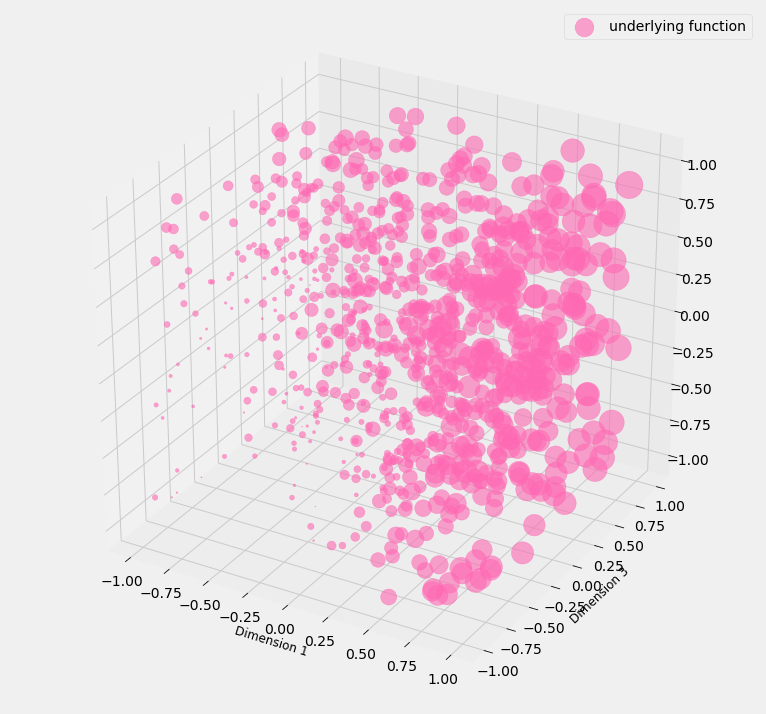

In [35]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import optimizers

#Data

n = 1000
d = 3
x = np.random.uniform(-1, 1, (n, d))

weights_true = np.array([[5, 2, 1],]).T
bias_true = np.array([1])

y_true = (x ** 2) @ weights_true + x @ weights_true + bias_true
print(f'x: {x.shape}, weights: {weights_true.shape}, bias: {bias_true.shape}, y: {y_true.shape}')

plot_4d(x, y_true)


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 3)]               0         
                                                                 
 dense_1 (Dense)             (None, 10)                40        
                                                                 
 linear (Dense)              (None, 1)                 11        
                                                                 
Total params: 51
Trainable params: 51
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/10
32/32 [==============================] - 0s 1ms/step - loss: 3.0118
Epoch 2/10
32/32 [==============================] - 0s 1ms/step - loss: 0.3449
Epoch 3/10
32/32 [==============================] - 0s 1ms/step - loss: 0.3366
Epoch 4/10
32/32 [==============================] - 0s 1ms/step - loss: 0.2612
Epoch 5/

/usr/local/lib/python3.7/dist-packages/matplotlib/collections.py:885: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


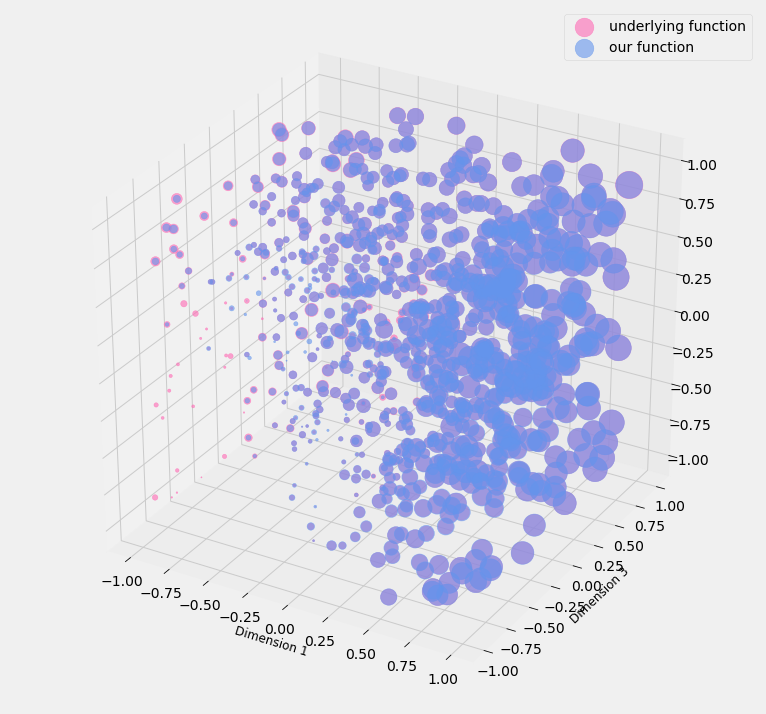

In [36]:
inputs = keras.Input(shape=(3,))
l1 = layers.Dense(10, activation='relu', name='dense_1')(inputs)
outputs = layers.Dense(1, name='linear')(l1)

model = keras.Model(inputs=inputs, outputs=outputs)
print(model.summary())
model.compile(loss='mse', optimizer=optimizers.SGD(0.1))

model.fit(x, y_true, epochs=10)

y_pred = model.predict(x)

plot_4d(x, y_true, model(x))

# **Write a colab with tensorflow only but using high level api**

In [ ]:
import tensorflow as tf
from tensorflow import keras